In [1]:
import torchvision as tv
import phototour
import torch
from tqdm import tqdm 
import numpy as np
import torch.nn as nn
import math 
import tfeat_model
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import os


In [2]:
#init tfeat and load the trained weights
tfeat = tfeat_model.TNet()
models_path = '../pretrained-models'
net_name = 'tfeat-yosemite'
tfeat.load_state_dict(torch.load(os.path.join(models_path,net_name+".params")))
# tfeat.cuda()
tfeat.eval()
all_good_matches = []

(1024, 768)
81


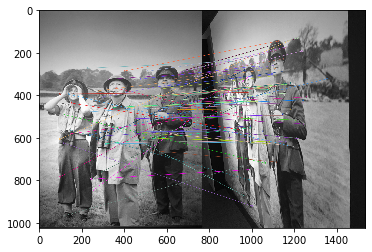

Wall time: 841 ms


(<matplotlib.image.AxesImage at 0x1daef6e2240>, None)

In [3]:
%%time

import cv2
import tfeat_utils
import numpy as np
import cv2
from matplotlib import pyplot as plt


img1 = cv2.imread('../imgs/v_churchill/1.ppm',0) 
img2 = cv2.imread('../imgs/v_churchill/6.ppm',0)
print(img1.shape)
brisk = cv2.BRISK_create()
kp1, des1 = brisk.detectAndCompute(img1,None)
kp2, des2 = brisk.detectAndCompute(img2,None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1,des2, k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])
print(len(good))      
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
plt.imshow(img3),plt.show()

70


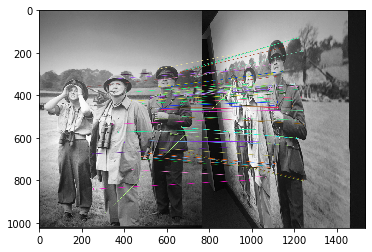

Wall time: 2.7 s


(<matplotlib.image.AxesImage at 0x1daef63e940>, None)

In [4]:
%%time

# mag_factor is how many times the original keypoint scale
# is enlarged to generate a patch from a keypoint
mag_factor = 3
desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

print(len(good))
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

plt.imshow(img3),plt.show()

********************************************************************
28


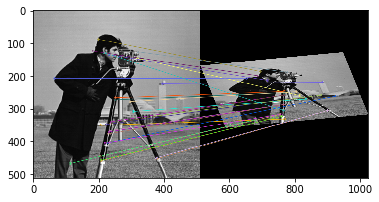

53


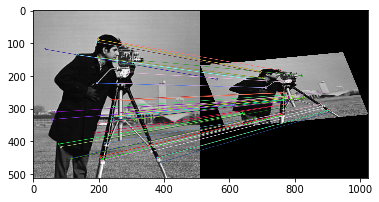

##########################################################################
39


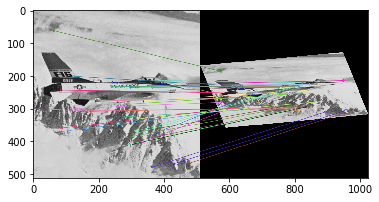

51


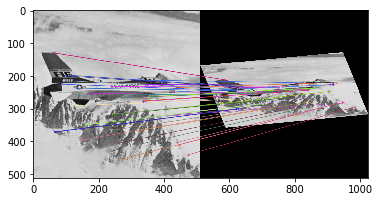

##########################################################################
25


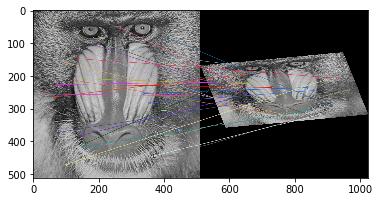

29


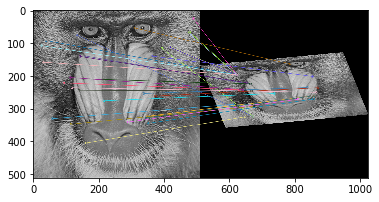

##########################################################################
24


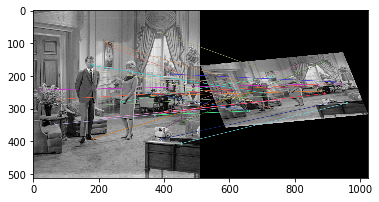

65


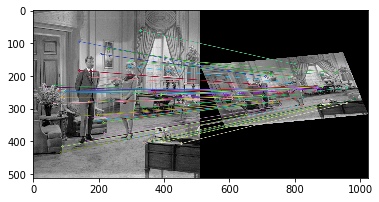

##########################################################################
17


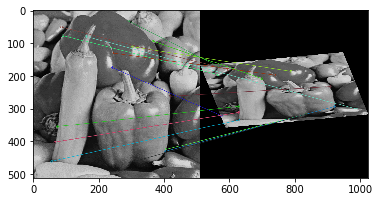

42


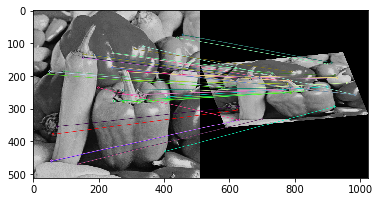

##########################################################################
39


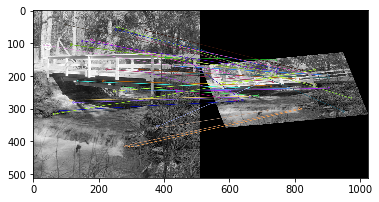

29


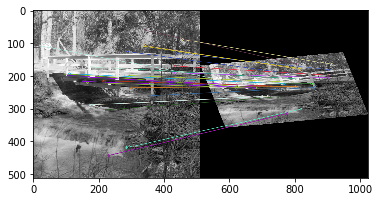

##########################################################################
13


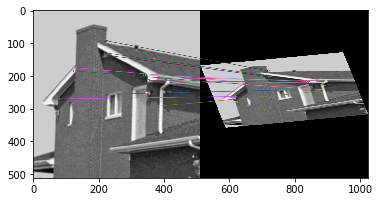

22


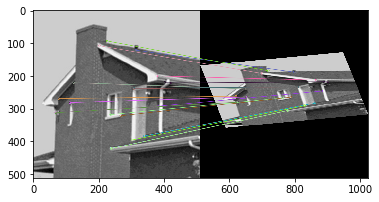

##########################################################################
17


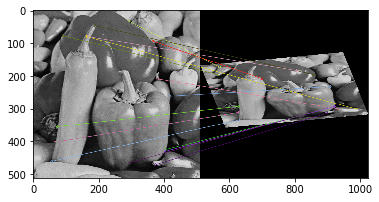

38


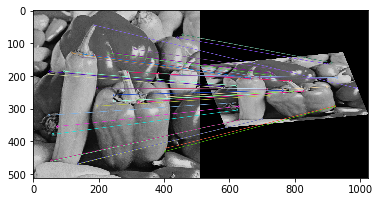

##########################################################################
29


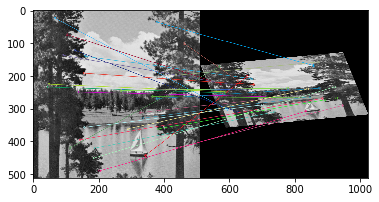

25


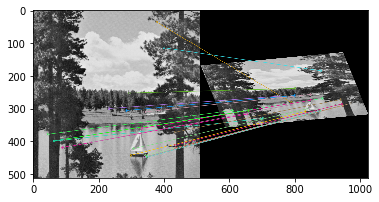

##########################################################################
33


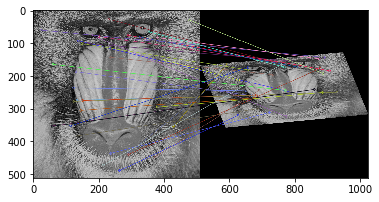

35


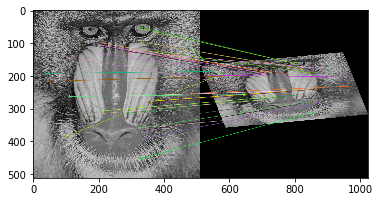

##########################################################################
38


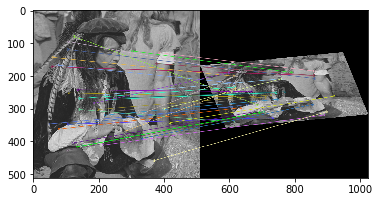

42


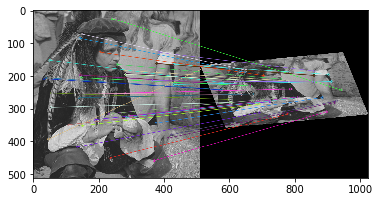

##########################################################################
[[(28, 53), (39, 51), (25, 29), (24, 65), (17, 42), (39, 29), (13, 22), (17, 38), (29, 25), (33, 35), (38, 42)]]


In [23]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        brisk = cv2.BRISK_create()
        kp1, des1 = brisk.detectAndCompute(img1,None)
        kp2, des2 = brisk.detectAndCompute(img2,None)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good)) 
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher(cv2.NORM_L2)
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

105


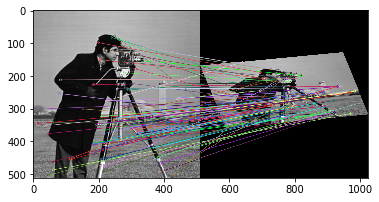

97


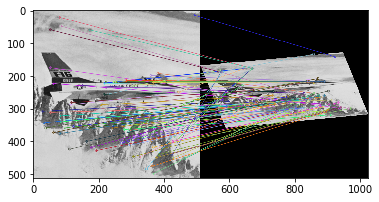

72


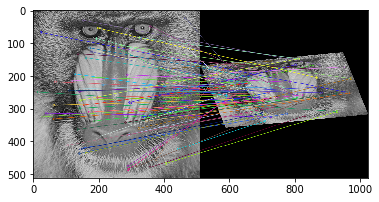

130


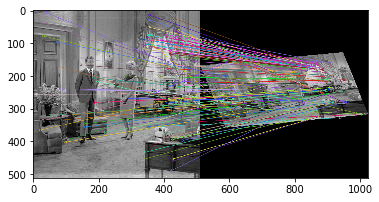

67


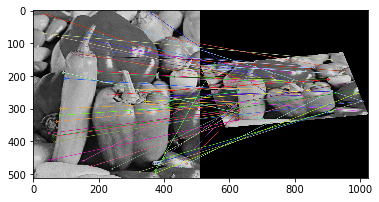

97


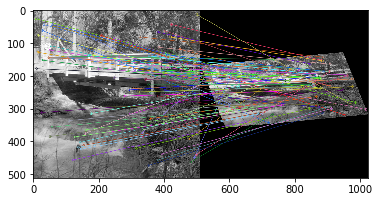

66


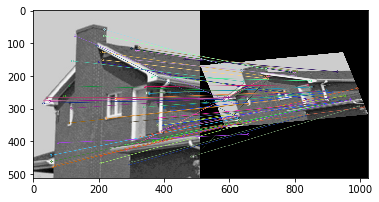

65


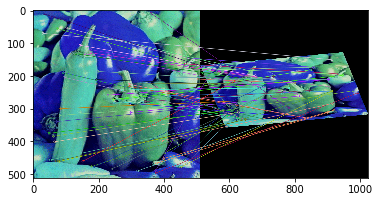

111


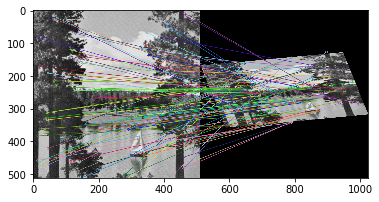

51


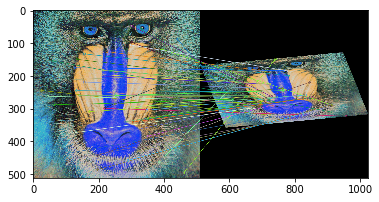

95


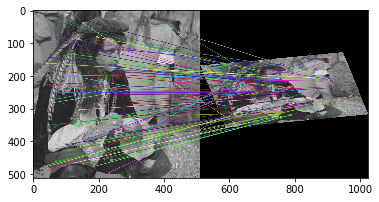

In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1

for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)

        ##bf = cv2.BFMatcher(cv2.NORM_HAMMING)
        ##matches = bf.knnMatch(des1,des2, k=2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))      
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        
        

********************************************************************
105


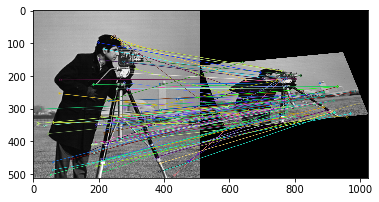

128


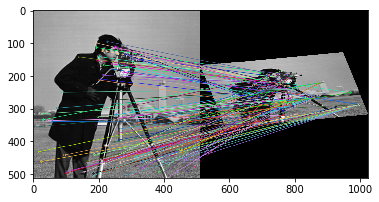

##########################################################################
97


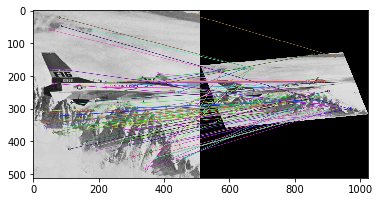

80


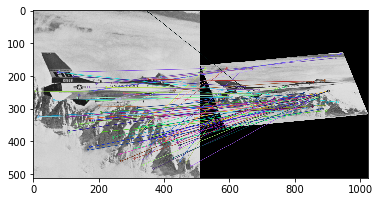

##########################################################################
72


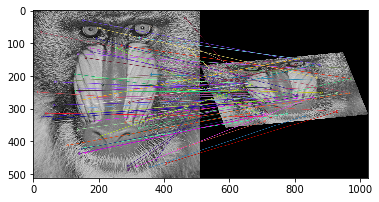

276


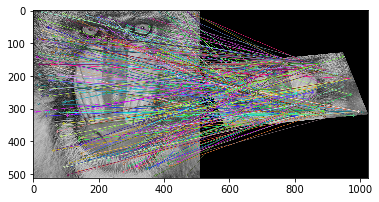

##########################################################################
130


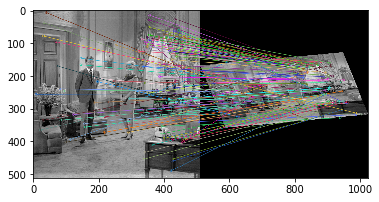

88


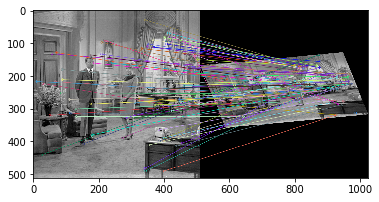

##########################################################################
67


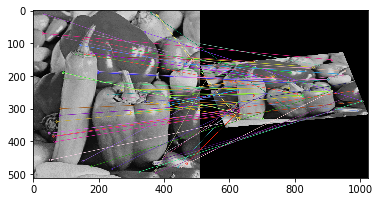

41


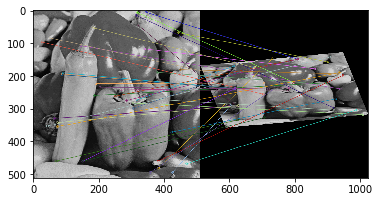

##########################################################################
97


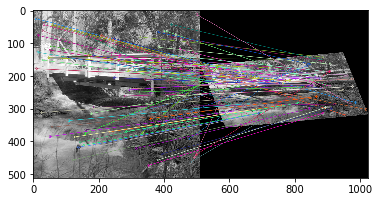

79


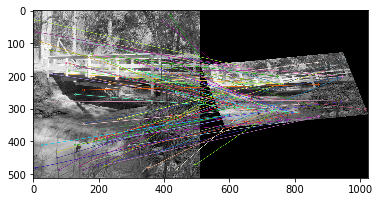

##########################################################################
66


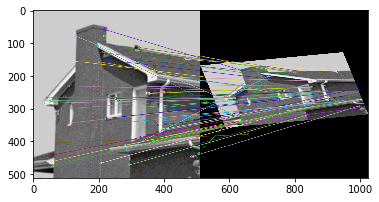

38


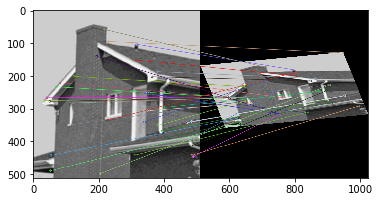

##########################################################################
65


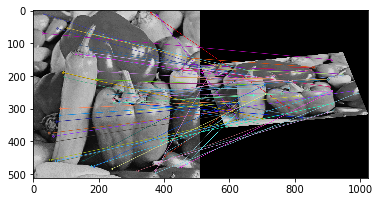

46


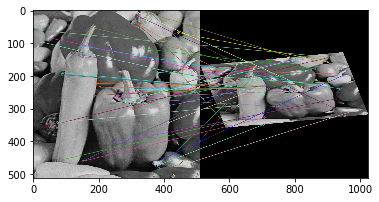

##########################################################################
111


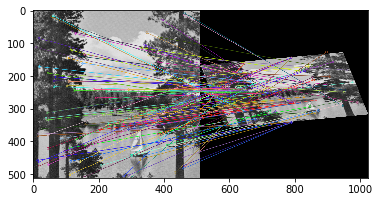

85


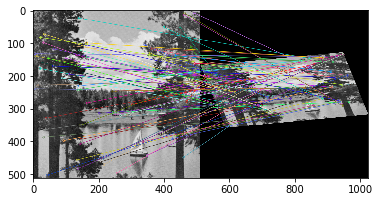

##########################################################################
51


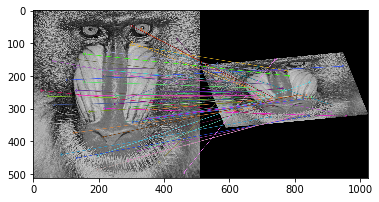

54


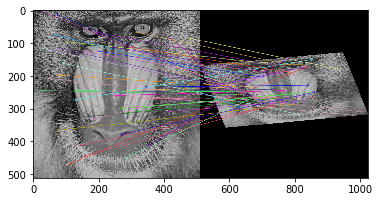

##########################################################################
95


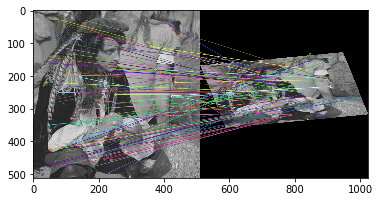

52


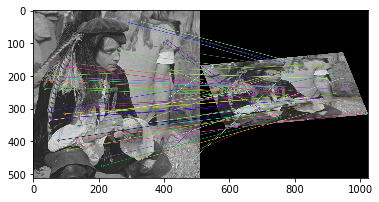

##########################################################################
[[(28, 53), (39, 51), (25, 29), (24, 65), (17, 42), (39, 29), (13, 22), (17, 38), (29, 25), (33, 35), (38, 42)], [(105, 128), (97, 80), (72, 276), (130, 88), (67, 41), (97, 79), (66, 38), (65, 46), (111, 85), (51, 54), (95, 52)]]


In [25]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
131


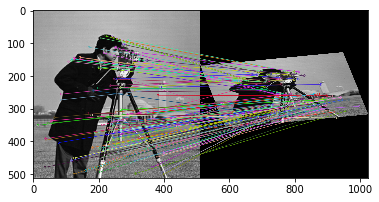

40


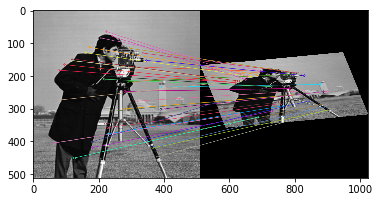

##########################################################################
102


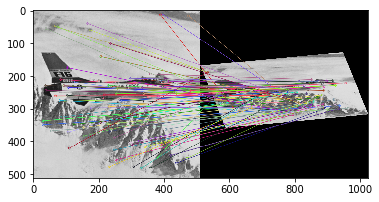

34


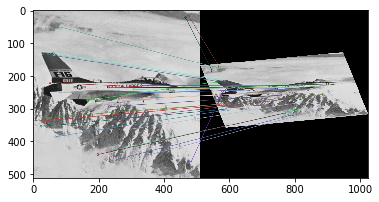

##########################################################################
133


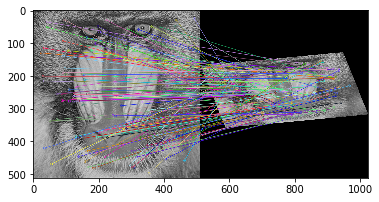

58


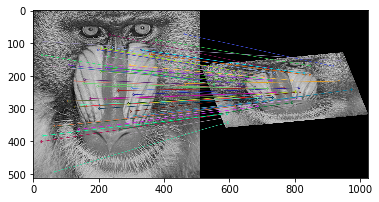

##########################################################################
176


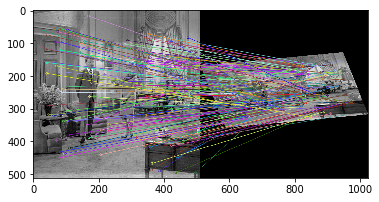

72


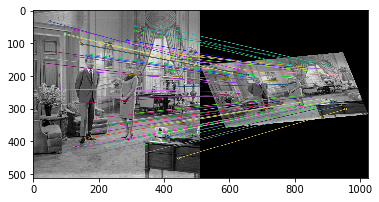

##########################################################################
152


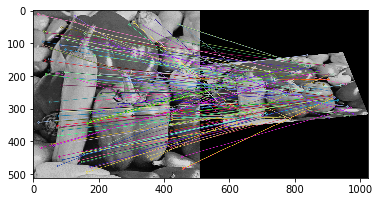

73


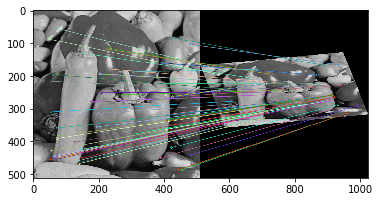

##########################################################################
115


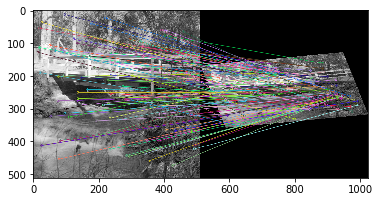

18


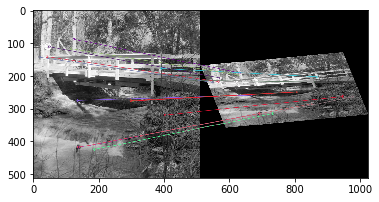

##########################################################################
140


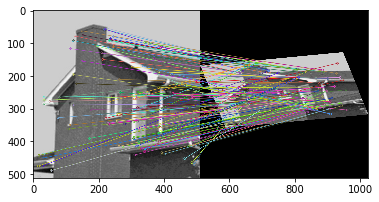

63


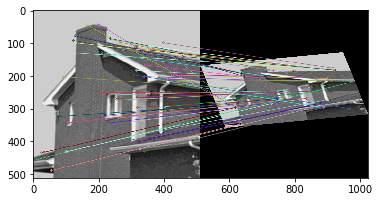

##########################################################################
144


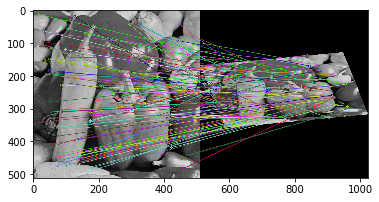

67


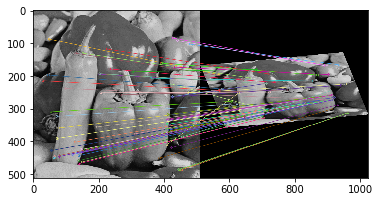

##########################################################################
115


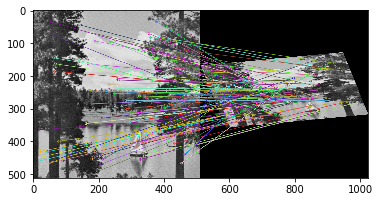

27


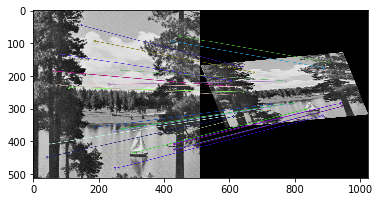

##########################################################################
159


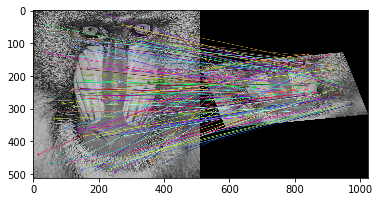

91


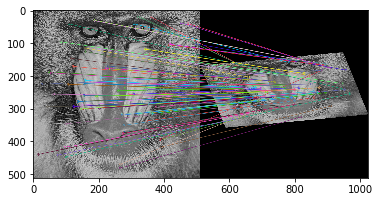

##########################################################################
141


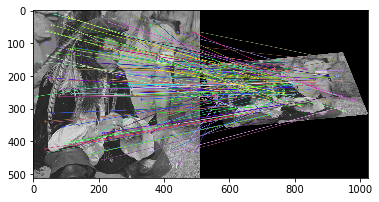

37


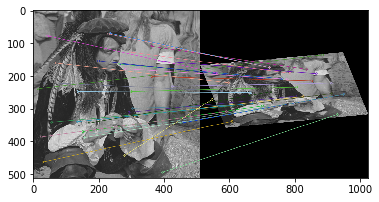

##########################################################################
[[(28, 53), (39, 51), (25, 29), (24, 65), (17, 42), (39, 29), (13, 22), (17, 38), (29, 25), (33, 35), (38, 42)], [(105, 128), (97, 80), (72, 276), (130, 88), (67, 41), (97, 79), (66, 38), (65, 46), (111, 85), (51, 54), (95, 52)], [(131, 40), (102, 34), (133, 58), (176, 72), (152, 73), (115, 18), (140, 63), (144, 67), (115, 27), (159, 91), (141, 37)]]


In [26]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        surf = cv2.xfeatures2d.SURF_create()
        kp1, des1 = surf.detectAndCompute(img1,None)
        kp2, des2 = surf.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
34


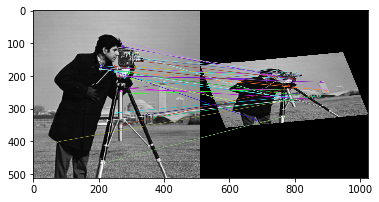

9


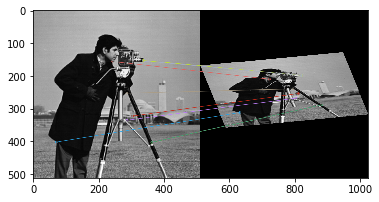

##########################################################################
36


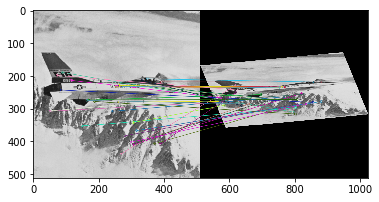

7


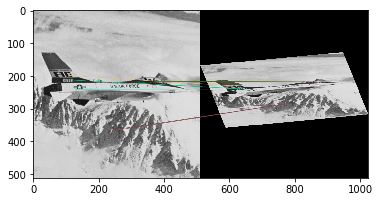

##########################################################################
26


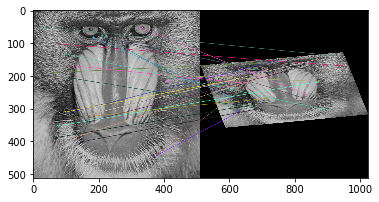

9


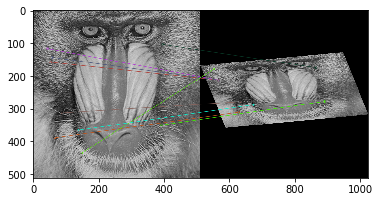

##########################################################################
41


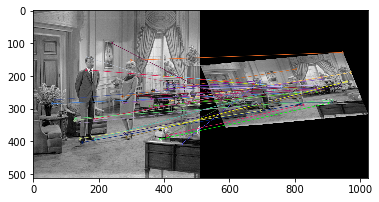

11


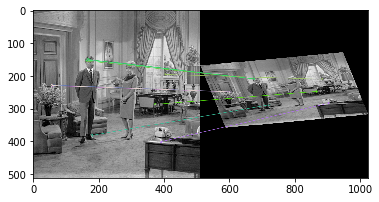

##########################################################################
52


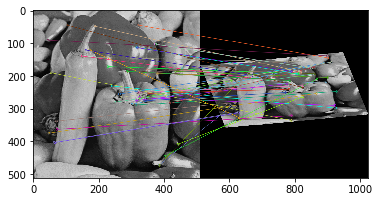

8


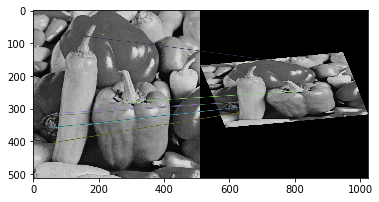

##########################################################################
32


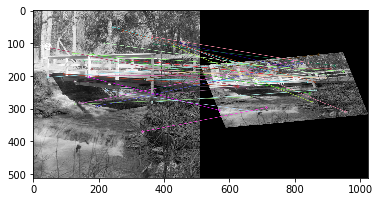

11


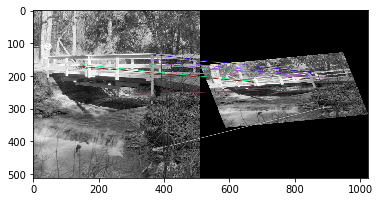

##########################################################################
22


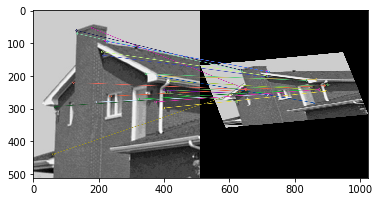

18


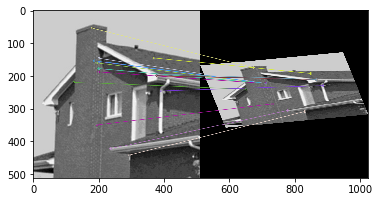

##########################################################################
56


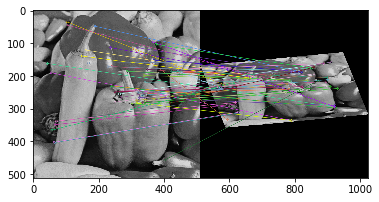

5


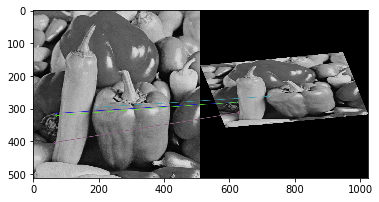

##########################################################################
42


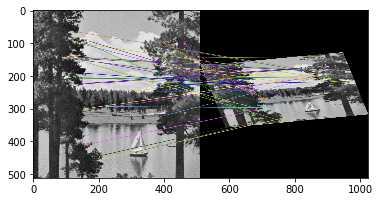

1


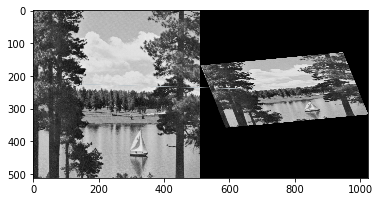

##########################################################################
22


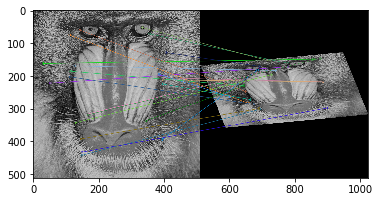

3


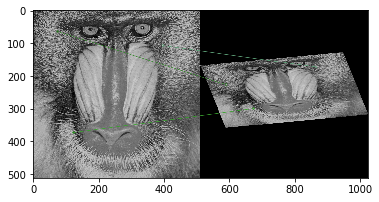

##########################################################################
53


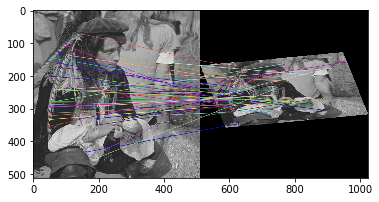

2


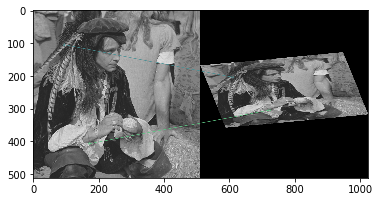

##########################################################################
[[(28, 53), (39, 51), (25, 29), (24, 65), (17, 42), (39, 29), (13, 22), (17, 38), (29, 25), (33, 35), (38, 42)], [(105, 128), (97, 80), (72, 276), (130, 88), (67, 41), (97, 79), (66, 38), (65, 46), (111, 85), (51, 54), (95, 52)], [(131, 40), (102, 34), (133, 58), (176, 72), (152, 73), (115, 18), (140, 63), (144, 67), (115, 27), (159, 91), (141, 37)], [(34, 9), (36, 7), (26, 9), (41, 11), (52, 8), (32, 11), (22, 18), (56, 5), (42, 1), (22, 3), (53, 2)]]


In [27]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        orb = cv2.ORB_create(nfeatures=1500)
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
23


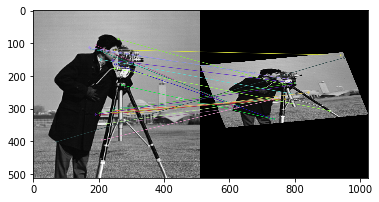

32


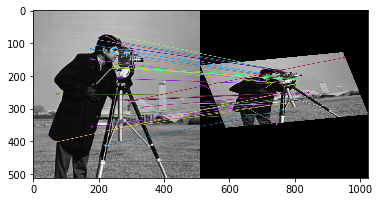

##########################################################################
31


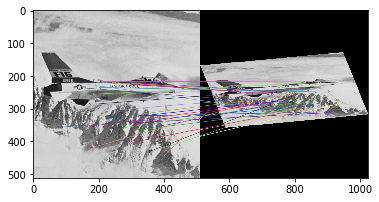

19


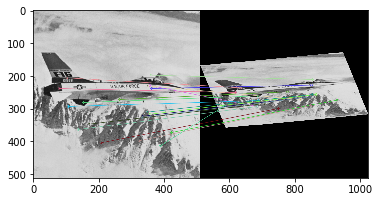

##########################################################################
20


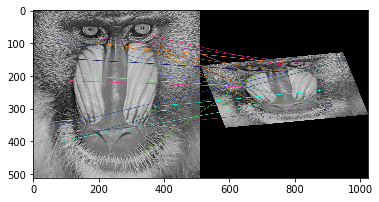

11


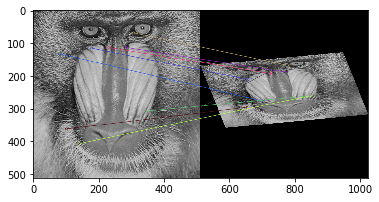

##########################################################################
15


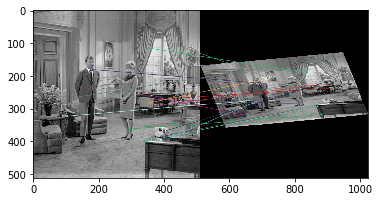

16


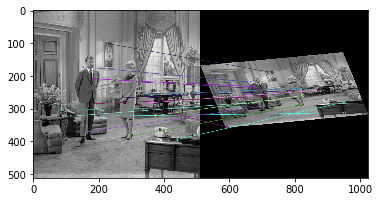

##########################################################################
14


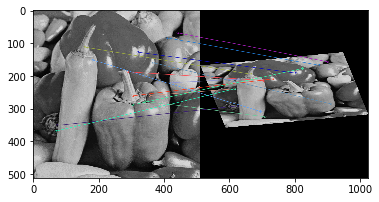

20


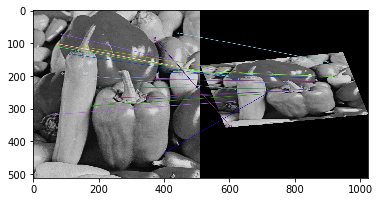

##########################################################################
22


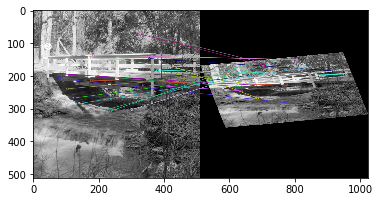

12


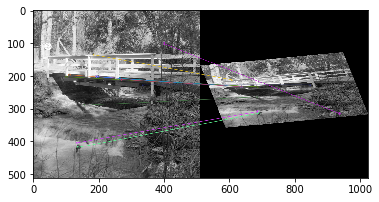

##########################################################################
7


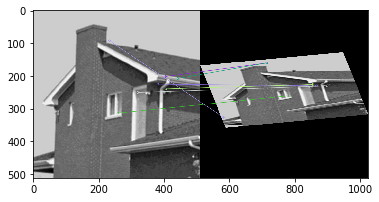

12


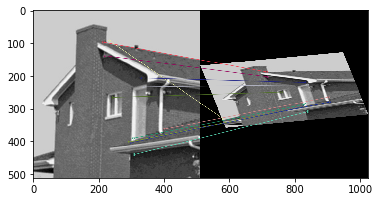

##########################################################################
15


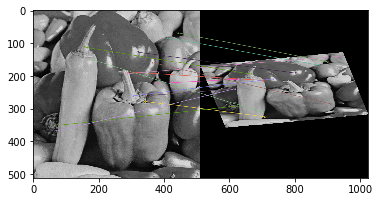

20


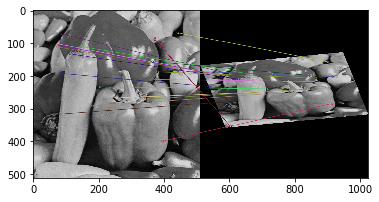

##########################################################################
27


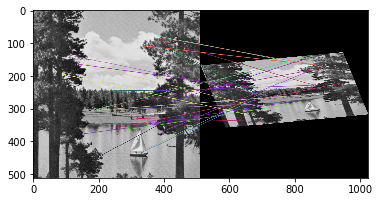

8


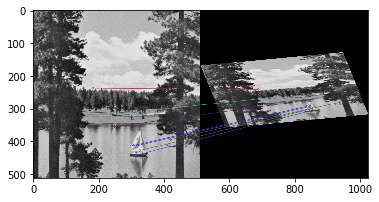

##########################################################################
22


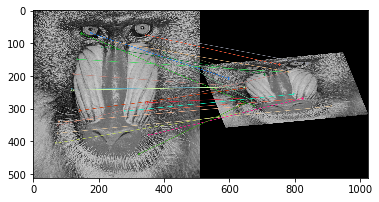

17


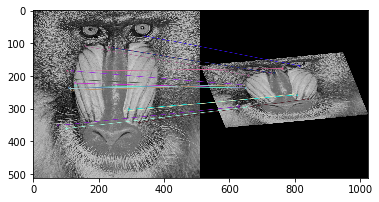

##########################################################################
17


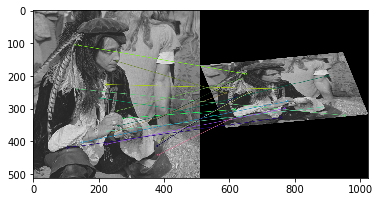

23


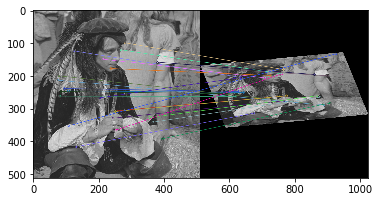

##########################################################################
[[(28, 53), (39, 51), (25, 29), (24, 65), (17, 42), (39, 29), (13, 22), (17, 38), (29, 25), (33, 35), (38, 42)], [(105, 128), (97, 80), (72, 276), (130, 88), (67, 41), (97, 79), (66, 38), (65, 46), (111, 85), (51, 54), (95, 52)], [(131, 40), (102, 34), (133, 58), (176, 72), (152, 73), (115, 18), (140, 63), (144, 67), (115, 27), (159, 91), (141, 37)], [(34, 9), (36, 7), (26, 9), (41, 11), (52, 8), (32, 11), (22, 18), (56, 5), (42, 1), (22, 3), (53, 2)], [(23, 32), (31, 19), (20, 11), (15, 16), (14, 20), (22, 12), (7, 12), (15, 20), (27, 8), (22, 17), (17, 23)]]


In [28]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        # Initiate FAST detector
        star = cv2.xfeatures2d.StarDetector_create()
        # Initiate BRIEF extractor
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        # find the keypoints with STAR
        kp1 = star.detect(img1,None)
        kp2 = star.detect(img2,None)
        # compute the descriptors with BRIEF
        kp1, des1 = brief.compute(img1, kp1)
        kp2, des2 = brief.compute(img2, kp2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1109


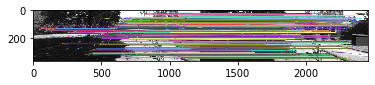

2163


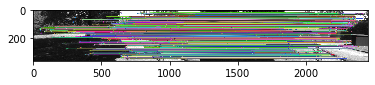

##########################################################################
875


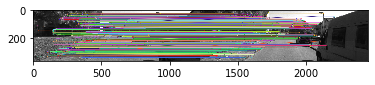

1443


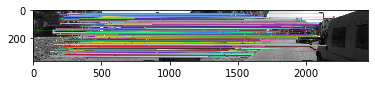

##########################################################################
1626


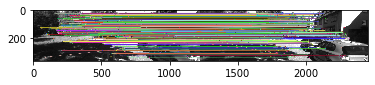

2761


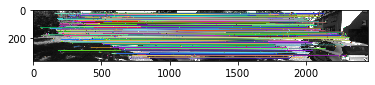

##########################################################################
1400


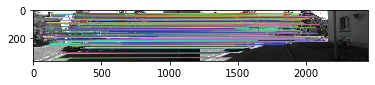

2205


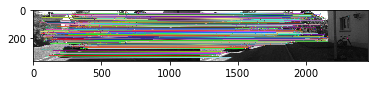

##########################################################################
510


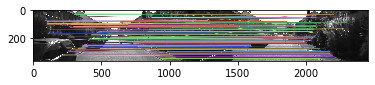

1136


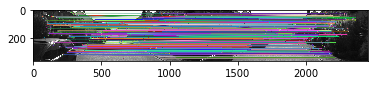

##########################################################################
566


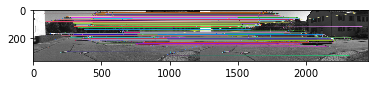

795


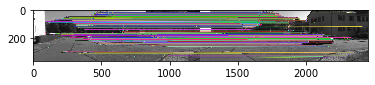

##########################################################################
988


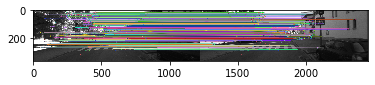

1682


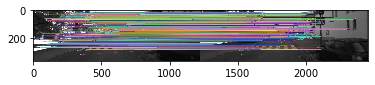

##########################################################################
565


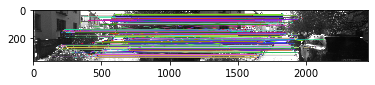

1277


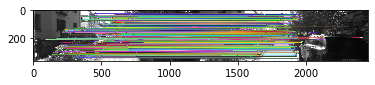

##########################################################################
963


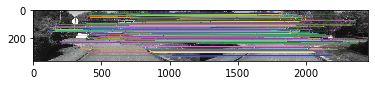

1474


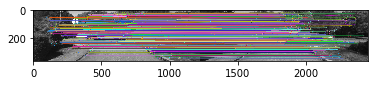

##########################################################################
1050


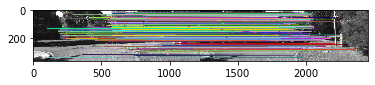

1844


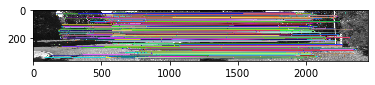

##########################################################################
648


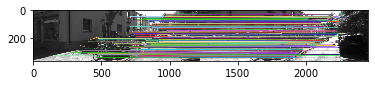

1223


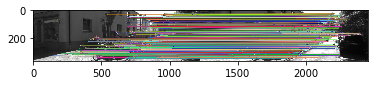

##########################################################################
1248


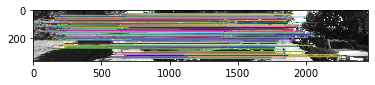

2150


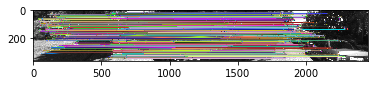

##########################################################################
[[(1109, 2163), (875, 1443), (1626, 2761), (1400, 2205), (510, 1136), (566, 795), (988, 1682), (565, 1277), (963, 1474), (1050, 1844), (648, 1223), (1248, 2150)]]


In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        brisk = cv2.BRISK_create()
        kp1, des1 = brisk.detectAndCompute(img1,None)
        kp2, des2 = brisk.detectAndCompute(img2,None)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good)) 
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher(cv2.NORM_L2)
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1074


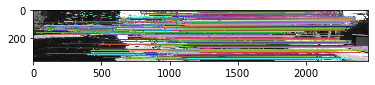

894


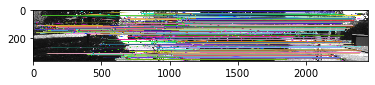

##########################################################################
1094


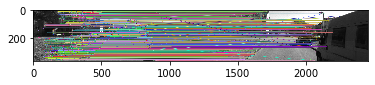

759


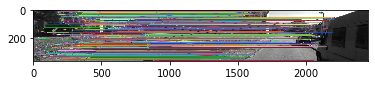

##########################################################################
1497


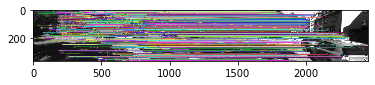

1043


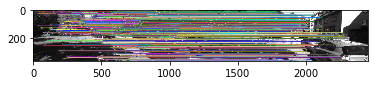

##########################################################################
1292


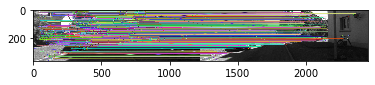

922


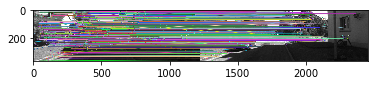

##########################################################################
540


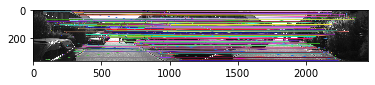

410


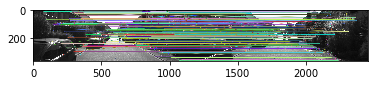

##########################################################################
599


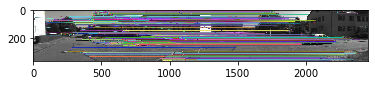

498


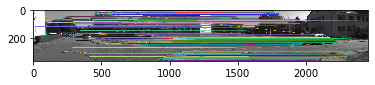

##########################################################################
888


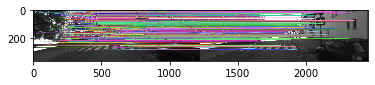

709


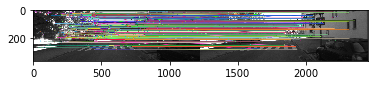

##########################################################################
541


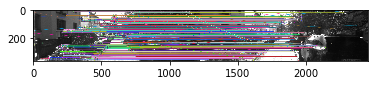

394


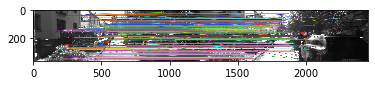

##########################################################################
1424


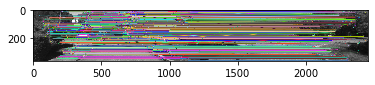

1007


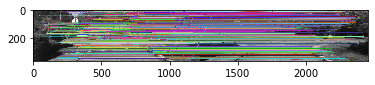

##########################################################################
1146


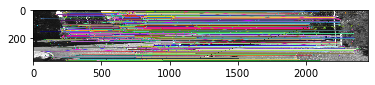

739


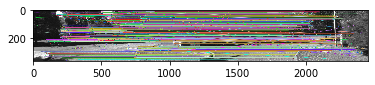

##########################################################################
629


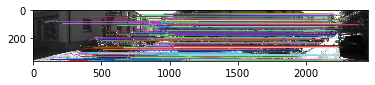

495


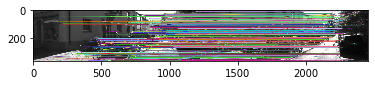

##########################################################################
1262


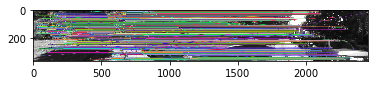

931


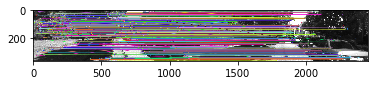

##########################################################################
[[(1109, 2163), (875, 1443), (1626, 2761), (1400, 2205), (510, 1136), (566, 795), (988, 1682), (565, 1277), (963, 1474), (1050, 1844), (648, 1223), (1248, 2150)], [(1074, 894), (1094, 759), (1497, 1043), (1292, 922), (540, 410), (599, 498), (888, 709), (541, 394), (1424, 1007), (1146, 739), (629, 495), (1262, 931)]]


In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1149


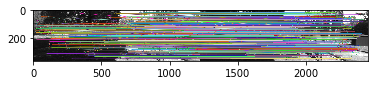

1219


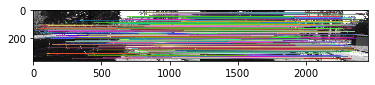

##########################################################################
1104


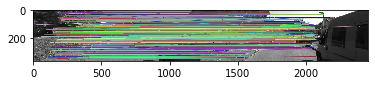

1177


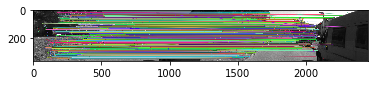

##########################################################################
1355


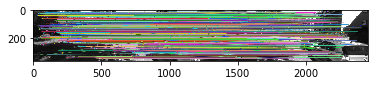

1484


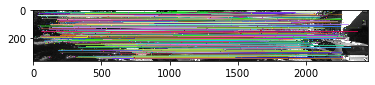

##########################################################################
1412


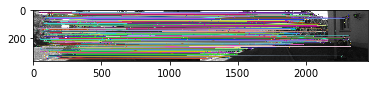

1449


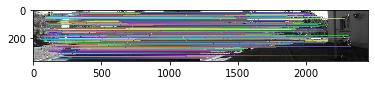

##########################################################################
778


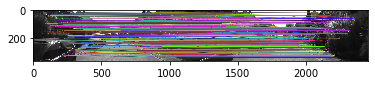

867


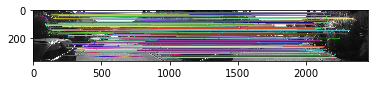

##########################################################################
1168


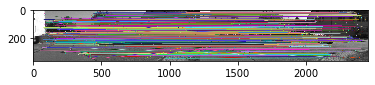

1201


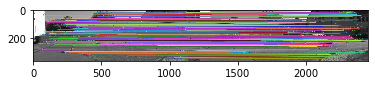

##########################################################################
968


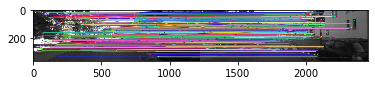

981


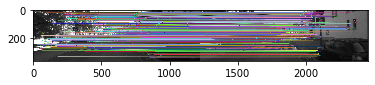

##########################################################################
585


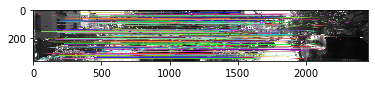

633


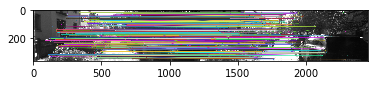

##########################################################################
1389


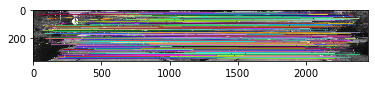

1508


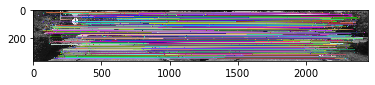

##########################################################################
1248


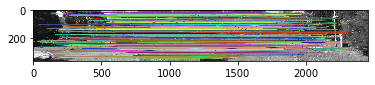

1318


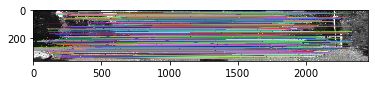

##########################################################################
780


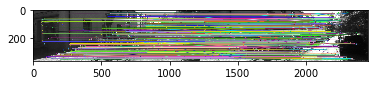

883


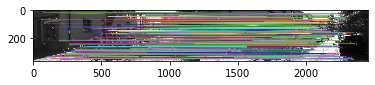

##########################################################################
993


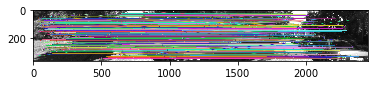

1100


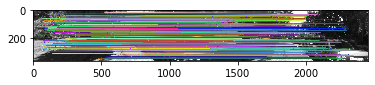

##########################################################################
[[(1109, 2163), (875, 1443), (1626, 2761), (1400, 2205), (510, 1136), (566, 795), (988, 1682), (565, 1277), (963, 1474), (1050, 1844), (648, 1223), (1248, 2150)], [(1074, 894), (1094, 759), (1497, 1043), (1292, 922), (540, 410), (599, 498), (888, 709), (541, 394), (1424, 1007), (1146, 739), (629, 495), (1262, 931)], [(1149, 1219), (1104, 1177), (1355, 1484), (1412, 1449), (778, 867), (1168, 1201), (968, 981), (585, 633), (1389, 1508), (1248, 1318), (780, 883), (993, 1100)]]


In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        surf = cv2.xfeatures2d.SURF_create()
        kp1, des1 = surf.detectAndCompute(img1,None)
        kp2, des2 = surf.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
185


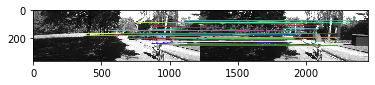

264


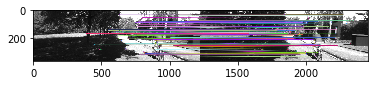

##########################################################################
419


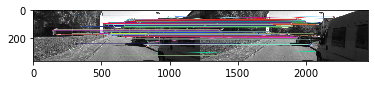

508


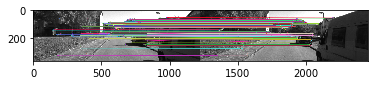

##########################################################################
271


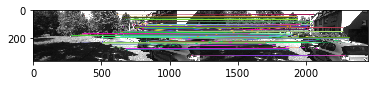

365


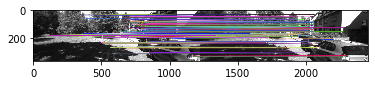

##########################################################################
378


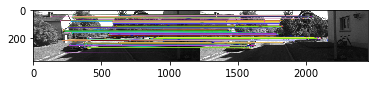

514


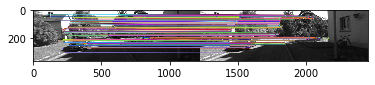

##########################################################################
193


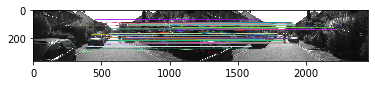

315


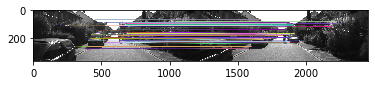

##########################################################################
457


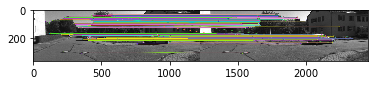

713


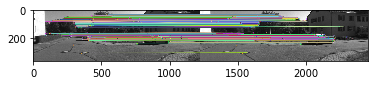

##########################################################################
209


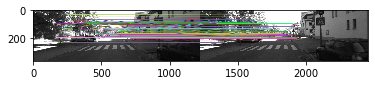

281


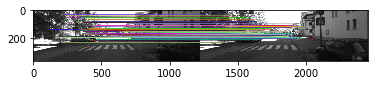

##########################################################################
121


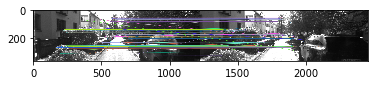

203


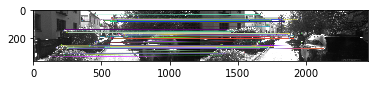

##########################################################################
414


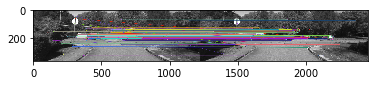

604


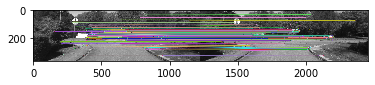

##########################################################################
264


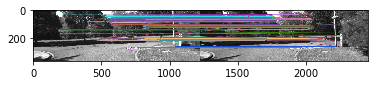

333


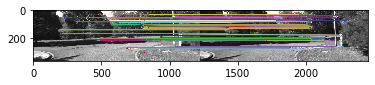

##########################################################################
154


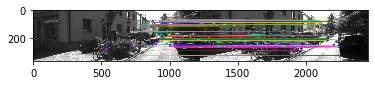

230


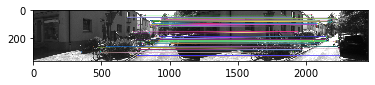

##########################################################################
151


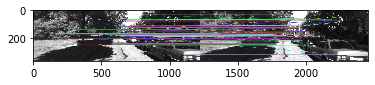

218


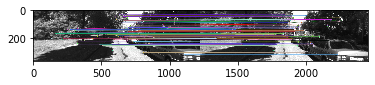

##########################################################################
[[(1109, 2163), (875, 1443), (1626, 2761), (1400, 2205), (510, 1136), (566, 795), (988, 1682), (565, 1277), (963, 1474), (1050, 1844), (648, 1223), (1248, 2150)], [(1074, 894), (1094, 759), (1497, 1043), (1292, 922), (540, 410), (599, 498), (888, 709), (541, 394), (1424, 1007), (1146, 739), (629, 495), (1262, 931)], [(1149, 1219), (1104, 1177), (1355, 1484), (1412, 1449), (778, 867), (1168, 1201), (968, 981), (585, 633), (1389, 1508), (1248, 1318), (780, 883), (993, 1100)], [(185, 264), (419, 508), (271, 365), (378, 514), (193, 315), (457, 713), (209, 281), (121, 203), (414, 604), (264, 333), (154, 230), (151, 218)]]


In [8]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        orb = cv2.ORB_create(nfeatures=1500)
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
236


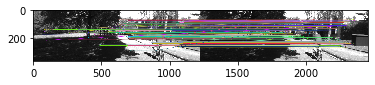

301


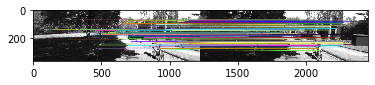

##########################################################################
175


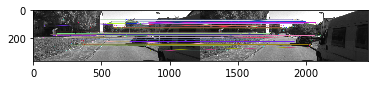

202


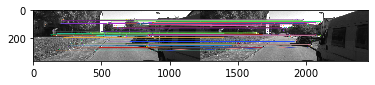

##########################################################################
249


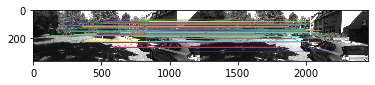

296


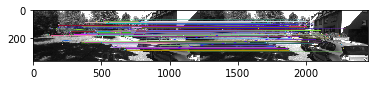

##########################################################################
229


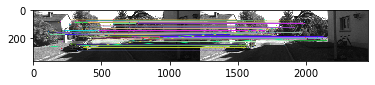

282


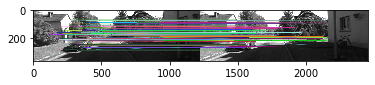

##########################################################################
124


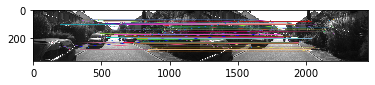

164


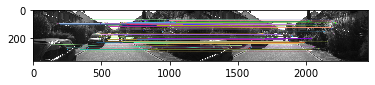

##########################################################################
117


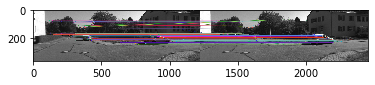

132


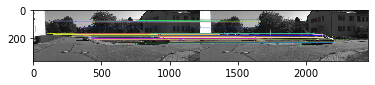

##########################################################################
286


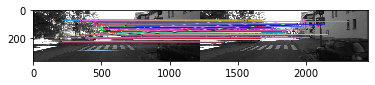

331


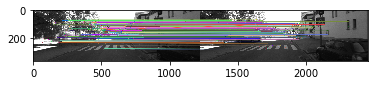

##########################################################################
155


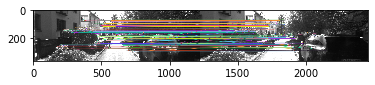

218


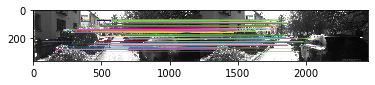

##########################################################################
148


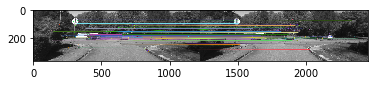

179


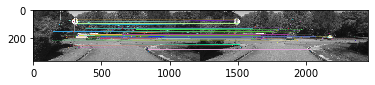

##########################################################################
143


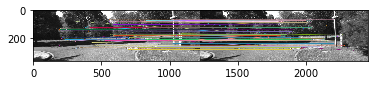

161


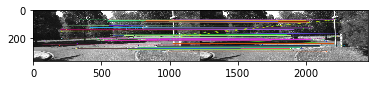

##########################################################################
117


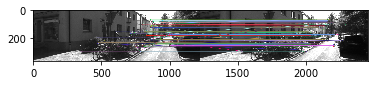

171


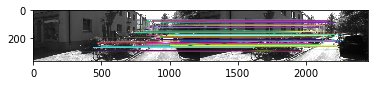

##########################################################################
275


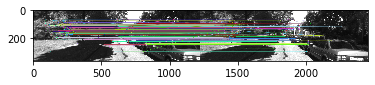

344


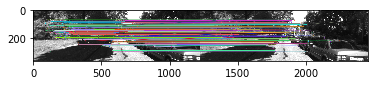

##########################################################################
[[(1109, 2163), (875, 1443), (1626, 2761), (1400, 2205), (510, 1136), (566, 795), (988, 1682), (565, 1277), (963, 1474), (1050, 1844), (648, 1223), (1248, 2150)], [(1074, 894), (1094, 759), (1497, 1043), (1292, 922), (540, 410), (599, 498), (888, 709), (541, 394), (1424, 1007), (1146, 739), (629, 495), (1262, 931)], [(1149, 1219), (1104, 1177), (1355, 1484), (1412, 1449), (778, 867), (1168, 1201), (968, 981), (585, 633), (1389, 1508), (1248, 1318), (780, 883), (993, 1100)], [(185, 264), (419, 508), (271, 365), (378, 514), (193, 315), (457, 713), (209, 281), (121, 203), (414, 604), (264, 333), (154, 230), (151, 218)], [(236, 301), (175, 202), (249, 296), (229, 282), (124, 164), (117, 132), (286, 331), (155, 218), (148, 179), (143, 161), (117, 171), (275, 344)]]


In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        # Initiate FAST detector
        star = cv2.xfeatures2d.StarDetector_create()
        # Initiate BRIEF extractor
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        # find the keypoints with STAR
        kp1 = star.detect(img1,None)
        kp2 = star.detect(img2,None)
        # compute the descriptors with BRIEF
        kp1, des1 = brief.compute(img1, kp1)
        kp2, des2 = brief.compute(img2, kp2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)